### Miguel Hidalgo  &  Noé Backé
### M1 Data - Sup de Vinci

# Projet de classification d'images avec CNNs
Le projet consiste à catégoriser des images des personnes heureuses (happy) et pas heureuses (sad) entre leurs deux classes, et donc à construir un modèle capable de prédire si une image corresponde à la catégorie des personnes 'happy' ou 'sad'.

### Sommaire :
1. Téléchargement et Préparation des Données
2. Création et Entraînement du Modèle 
3. Visualisation des Résultats
4. Prédiction sur de Nouvelles Images
5. Conclusion
6. Anexe

## 1. Téléchargement de données
Pour ce projet, nous avons décidé d'utiliser la donnée d'internet, donc la donnée des résultats de recherche des navigateurs. Nous nous sommes dirigés vers 'Google Images' et nous avons cherche sur leur moteur de recherche les mots clefs : 'happy person' et 'sad person' (ainsi que 'happy woman', 'happy man', 'sad woman', 'sad man'). Une fois les images téléchargées, nous avons déposé les images de chaque catégorie dans un dossier temporel et nous avons procédé avec le nettoyage : pour cela nous avons supprimé les images d'une taille inférieur à 10k ainsi que les images qui ne correspondait pas à un visage ou qui n'exprimait pas de façon claire soit le bonheur (happy) ou la tristesse (sad).

Une fois les données se trouvait en bon état, nous avons procédé à charger nos deux classes sur le cloud ; pour cela nous avons choisi Google Drive (car il permet de partager la donnée de façon universelle et rapide). Nous allons montrer donc à partir du code suivant l'extraction de la donnée depuis le dossier d'accèes libre google drive sur un dossier comprimé .zip dans l'ordinateur de l'utilisatuer qui contiendra les images d'entrainement de notre modèle de clasification machine learning, nous allons proceder avec le téléchargement des images, le chargement de ces images sur ce jupyter notebook, l'analyse descriptive de ces images et l'entrinement de notre modèle convolutionel du ML.

### 1.1 Chargement de la donnée depuis google drive
Cette partie du projet consiste à télécharger un fichier zip d'images depuis l'adresse Google Drive : https://drive.google.com/file/d/1c2KbH3i45XR5jWnRzLcOruaNDouJAqpX, puis à l'extraire et à préparer ces images pour notre model d'apprentissage automatique. Tout d'abord, le fichier zip est téléchargé à partir de Google Drive en utilisant la bibliothèque gdown et est sauvegardé sous le nom images.zip. Avant de l'extraire, nous utilisons les commandes 'system' et 'os' pour vérifier si le répertoire images existe déjà. Si c'est le cas, nous supprimons ce répertoire pour éviter toute accumulation de données des exécutions précédentes. Pour le faire tant sur Windows comme sur Linux et Mac nous utilisons aussi 'platform'. 

Ensuite, le fichier zip est extrait dans un répertoire appelé 'images' en utilisant la bibliothèque zipfile. Une fois extrait, le fichier zip est supprimé pour nettoyer l'espace de travail, et nous pouvons alors préparer les images pour l'apprentissage automatique. 

In [12]:
!pip install gdown


[notice] A new release of pip is available: 23.3.2 -> 24.0
[notice] To update, run: python.exe -m pip install --upgrade pip


In [56]:
# Partie 1.1 : Téléchargement des images de Google Drive
import gdown
import zipfile
import os
import platform

# URL du dossier Google Drive
url = 'https://drive.google.com/uc?id=1c2KbH3i45XR5jWnRzLcOruaNDouJAqpX'

# Destination du dossier téléchargé
output = 'images.zip'

# Suppression et création du dossier 'images'
if os.path.exists('images'):
    if platform.system() == "Windows":
        os.system('rmdir /S /Q images')
    else:  # For Linux and MacOS
        os.system('rm -rf images')
os.makedirs('images')

# Téléchargement du .zip depuis Google Drive
gdown.download(url, output, quiet=False)

# Extraction du contenu du fichier .zip
with zipfile.ZipFile(output, 'r') as zip_ref:
    zip_ref.extractall('images')

# Suppression du fichier zip du répértoire de destination
os.remove(output)

Downloading...
From (original): https://drive.google.com/uc?id=1c2KbH3i45XR5jWnRzLcOruaNDouJAqpX
From (redirected): https://drive.google.com/uc?id=1c2KbH3i45XR5jWnRzLcOruaNDouJAqpX&confirm=t&uuid=dd8cf3b7-1a0d-40c9-86db-1616fb096a5c
To: c:\Users\Mike0\Desktop\SUP DE VINCI\Machine Learning\images.zip
100%|██████████| 254M/254M [00:41<00:00, 6.09MB/s] 


### 1.2 Préparation des images avant l'entrainement
Dans cette étape, nous allons préparer les images pour l'apprentissage automatique en utilisant ImageDataGenerator de Keras. Cette librerie normalise les valeurs des pixels des images. Les images sont chargées depuis le répertoire images, redimensionnées à 256x256 pixels, et préparées par lots de 32 images avec des étiquettes binaires "happy" (heureux) ou "sad" (pas heureux). 

Nous allons ainsi normaliser la donnée. Sachant que nous disposons de la donnée des images donc des pixels, nous avons de la donnée entre 0 et 255. Pour normaliser la donnée nous avons par objectif de la transformer pour qu'elle soit contenue entre 0 et 1; c'est pour cela que nous allons la diviser par 255 (pratique communne en aprentisage automatique avec des images).

Nous profitons de cette étape aussi pour diviser la donnée en donnée d'entrainement : "train_generator" avec 80% des images (donc 1124 images), et la donné de validation : "validation_generator" avec 20% des images (281 images). 

Finalement, nous allons dans la cellule suivant afficher la distribution d'images de chaque classe tant pour la donnée d'entrainement comme pour la donnée de validation ; c'est de cette façon que nous arrivons à voir que finalement nous disposerons de :
- Donnée d'entrainement -> happy : 536 , sad : 588
- Donnée de validation -> happy : 134 , sad : 147

In [4]:
!pip install tensorflow matplotlib

In [109]:
# Partie 1.2 : ImageDataGenerator pour charger les images du répértoire 'images'

import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense

# Répértoire des images 
base_dir = 'images'  

# ImageDataGenerator pour la normalisation et le rescaling des images
train_datagen = ImageDataGenerator(
    rescale=1./255,  # Nous normalisons en divisant /255
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest',
    validation_split=0.2  # 20% de la donnée sera utilisée pour la validation
)

# Generateur pour la donnée d'entrainement
train_generator = train_datagen.flow_from_directory(
    base_dir,
    target_size=(256, 256),  # Resize images 256x256
    batch_size=32,
    class_mode='binary',  # 'binary' deux classes
    subset='training'  # destinée pour donnée d'entrainement
)

# Generateur pour la donnée de validation
validation_generator = train_datagen.flow_from_directory(
    base_dir,
    target_size=(256, 256),
    batch_size=32,
    class_mode='binary', 
    subset='validation'  # destinée pour donnée de validation
)

Found 1124 images belonging to 2 classes.
Found 281 images belonging to 2 classes.


In [58]:
import numpy as np

# Function pour print le nombre d'images par classe
def print_class_counts(generator, name):
    class_indices = generator.class_indices
    labels = generator.classes
    unique, counts = np.unique(labels, return_counts=True)
    class_names = {v: k for k, v in class_indices.items()}
    print(f"Class indices for {name}: {class_indices}")
    for class_index, count in zip(unique, counts):
        print(f"Class '{class_names[class_index]}' (index {class_index}): {count} images")

# Print les valeurs de chaque classe pour le train_generator et le validation_generator
print_class_counts(train_generator, "train_generator")
print_class_counts(validation_generator, "validation_generator")

Class indices for train_generator: {'happy': 0, 'sad': 1}
Class 'happy' (index 0): 536 images
Class 'sad' (index 1): 588 images
Class indices for validation_generator: {'happy': 0, 'sad': 1}
Class 'happy' (index 0): 134 images
Class 'sad' (index 1): 147 images


### 1.3 : Affichage des images 'happy' et 'sad' avec Matplotlib
Dans cette section, nous allons afficher un lot d'images pour vérifier qu'en effet elles ont été bien récupérées et stockées dans leur classe respective. Les images sont visualisées à l'aide de matplotlib et choissies par hassard. Nous allons afficher donc 5 images de la classe 'happy' et 5 images de la classe 'sad' de la donnée d'entrainement 'train_generator'. Cette étape nous permet de s'assurer que les données sont correctement disposées avant l'entraînement du modèle de machine learning.


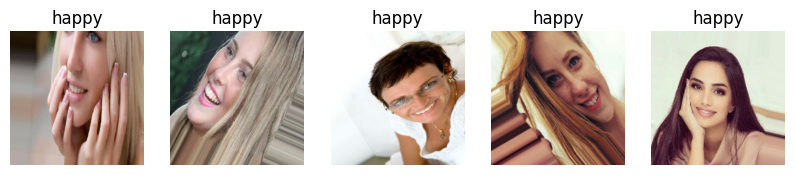

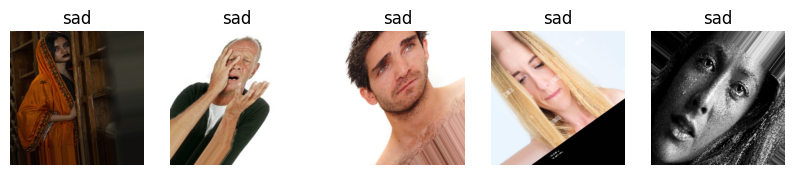

In [110]:
# Partie 1.3 : Affichage d'un échantillon aléatoire des images par classe

import matplotlib.pyplot as plt

# Choisir un lot d'images et leur label
x_batch, y_batch = next(train_generator)

def plot_images_by_class(images_arr, labels_arr, class_label, class_name, num_images=5):
    """   
    Parameters:
    images_arr: Liste de donnée des images.
    labels_arr: Liste des labels correspondant aux images.
    class_label: Label de la classe.
    class_name: La classe de l'image.
    num_images: Nombre d'iamges à afficher.
    """
    plt.figure(figsize=(10, 10))  # Taille de la figure
    count = 0
    for i in range(len(images_arr)):
        if labels_arr[i] == class_label:
            count += 1
            plt.subplot(num_images // 5, 5, count)
            plt.imshow(images_arr[i])
            plt.title(class_name)
            plt.axis('off')
            if count == num_images:
                break
    plt.show()

# Images de la classe 'happy' (0)
plot_images_by_class(x_batch, y_batch, class_label=0, class_name='happy', num_images=5)

# Images de la classe 'sad' (1)
plot_images_by_class(x_batch, y_batch, class_label=1, class_name='sad', num_images=5)


### Partie 1.4 : Analyse descriptive de la donnée
Nous allons maintenant nous focus sur le contenu et la forme de notre donnée. Tout d'abord, nous allons vérifier le reshaping de la data en batch's de 32 et dans une taille de 256x256. Nous allons aussi vérifier le contenu de notre donnée train et le fait qu'elle soit normalisée, donc bien comprise entre 0 et 1. Pour ce faire, nous allons vérifier que la valeur minimale de notre x_batch est 0 et que la valeur maximale contenu dans notre x_batch est 1. Finalement, nous allons bien vérifier que le contenu de la variable y_batch est de la donnée catégorique binaire (donc soit 0 ou 1 qui correspond à nos deux classes 'happy' et 'sad').

In [111]:
# Part 1.4 : Descriptive data
# data shape
x_batch.shape

(32, 256, 256, 3)

In [103]:
# Data normalisée contenue dans la donée d'entrainement
x_batch

array([[[[0.07105074, 0.05508696, 0.04304476],
         [0.06434521, 0.05365336, 0.04563447],
         [0.05763968, 0.05231225, 0.04831668],
         ...,
         [0.12657091, 0.09224285, 0.08242937],
         [0.18934183, 0.14554065, 0.12874787],
         [0.20513035, 0.15185606, 0.11927474]],

        [[0.08610214, 0.06110752, 0.04003448],
         [0.07939661, 0.05842531, 0.04137558],
         [0.07269108, 0.0557431 , 0.04271669],
         ...,
         [0.15343376, 0.11526815, 0.1028963 ],
         [0.19573773, 0.14809902, 0.12491031],
         [0.20416003, 0.14852145, 0.11617382]],

        [[0.08581311, 0.05397914, 0.02387526],
         [0.08849532, 0.05934357, 0.033263  ],
         [0.08774248, 0.06176366, 0.03970641],
         ...,
         [0.1802966 , 0.13829345, 0.12336323],
         [0.20213366, 0.1506574 , 0.12107276],
         [0.19776411, 0.14084636, 0.11361545]],

        ...,

        [[0.40693212, 0.22490299, 0.16012694],
         [0.38003743, 0.21891007, 0.15616496]

In [25]:
# Valeur minimale contenue dans la donnée d'entrainement
x_batch.min()

0.0

In [76]:
# Valeur maximale contenue dans la donnée d'entrainement
x_batch.max()

1.0

In [77]:
# Labels - 0 : happy et 1 : sad 
y_batch

array([0., 0., 1., 0., 1., 0., 1., 0., 0., 0., 0., 0., 1., 0., 1., 1., 1.,
       1., 0., 0., 0., 1., 1., 0., 1., 0., 1., 1., 0., 0., 1., 1.],
      dtype=float32)

## 2. Modèle d'aprentisage automatique 
Une fois nous allons vérifié que la donnée est comme souhaitée avant de la modélisation, c'est l'heure de construir notre modèle d'aprentisage automatique. Nous avons choisi pour réssoudre ce model d'apprentisage automatique le modèle de couches convolutionelles CNN, surtout sous la forme de couche convolutionelle conv2D.

Le modèle convolutionnel Conv2D est un type de réseau de neurones (CNN) utilisé principalement pour traiter des images. Il fonctionne en appliquant des filtres (ou "kernels") sur l'image pour détecter des caractéristiques spécifiques, comme des bords ou des textures. Ces filtres parcourent l'image et produisent des cartes de caractéristiques, qui sont ensuite utilisées par le réseau pour comprendre le contenu de l'image. En résumé, Conv2D aide le modèle à identifier et à extraire des motifs importants de l'image pour effectuer des tâches comme la classification ou la détection d'objets.

![Image of Yaktocat](https://iq.opengenus.org/content/images/2018/11/cnn.png)

### 2.1 : Modèle convolutionel Conv2D
Pour notre modèle nous avons choisi un 'sequential model' et de combiner des couches Conv2D et MaxPooling2D ; nous avons donc le modèle suivant : 
- Couche Conv2D de 16 filtres (3x3 pixels et qui bougera à 1 pixel à la fois) utilisée pour extraire des caractéristiques locales de l'image.
- Couche de pooling qui réduit la taille des caractéristiques en prenant le max sur une fenêtre de 2x2 pixels.
- Couche Conv2D de 32 filtres utilisés ici pour capturer des caractéristiques plus complexes et détaillées.
- Couche de pooling.
- Couche Conv2D de 16 filtres.
- Couche de pooling.
- Flatten pour aplatir la donnée en un vecteur de caractéristiques pour le passage aux couches denses.
- Couche dense de 256 neurones pour apprendre des combinaisons non-linéaires complexes des caractéristiques extraites.
- Une couche de sortie dense avec 1 neurone et une activation sigmoïde
- les fonctions d'activations 'relu' pour toutes les souscouches de neurones (pour rendre la donnée négative en zéro 0)
- la fonction d'activation de la dernière couche dense 'sigmoid' est utilisée xpour la classification binaire (0 ou 1) comme dans notre modèle ('happy' et 'sad').

Pour la compilation, nous avons choisi la descente du gradient 'SGD', et binary_crossentropy dû à notre model de prédiction binaire. 

Finalement, nous avons ainsi choisi 20 epochs, et un batch_size de 32 pour l'entrainement du model (model.fit).

In [120]:
from keras.optimizers import SGD

# Define a simple CNN model for binary classification
model = Sequential([
    Conv2D(16, (3, 3), activation='relu', input_shape=(256, 256, 3)),
    MaxPooling2D(),
    Conv2D(32, (3, 3), activation='relu'),
    MaxPooling2D(),
    Conv2D(64, (3, 3), activation='relu'),
    MaxPooling2D(),
    Flatten(),
    Dense(256, activation='relu'),
    Dense(1, activation='sigmoid')
])

# Compile the model
#model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy']) # optimizer='adam', loss='binary_crossentropy'
model.compile('SGD', loss=tf.losses.BinaryCrossentropy(), metrics =['accuracy'])

model.summary()

Model: "sequential_12"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_36 (Conv2D)          (None, 254, 254, 16)      448       
                                                                 
 max_pooling2d_36 (MaxPooli  (None, 127, 127, 16)      0         
 ng2D)                                                           
                                                                 
 conv2d_37 (Conv2D)          (None, 125, 125, 32)      4640      
                                                                 
 max_pooling2d_37 (MaxPooli  (None, 62, 62, 32)        0         
 ng2D)                                                           
                                                                 
 conv2d_38 (Conv2D)          (None, 60, 60, 64)        18496     
                                                                 
 max_pooling2d_38 (MaxPooli  (None, 30, 30, 64)      

In [121]:
# Train the model
history = model.fit(
    train_generator,
    validation_data=validation_generator,
    epochs=20,
    batch_size=32,
    validation_steps=len(validation_generator)  # Pour que la validation soit basée sur la donnée 'validation_generator' disponible
)

Epoch 1/20
36/36 [==============================] - 41s 1s/step - loss: 0.6995 - accuracy: 0.5053 - val_loss: 0.6892 - val_accuracy: 0.5125
Epoch 2/20
36/36 [==============================] - 40s 1s/step - loss: 0.6881 - accuracy: 0.5507 - val_loss: 0.7012 - val_accuracy: 0.5125
Epoch 3/20
36/36 [==============================] - 41s 1s/step - loss: 0.6889 - accuracy: 0.5632 - val_loss: 0.6803 - val_accuracy: 0.5302
Epoch 4/20
36/36 [==============================] - 40s 1s/step - loss: 0.6831 - accuracy: 0.5632 - val_loss: 0.6783 - val_accuracy: 0.5872
Epoch 5/20
36/36 [==============================] - 41s 1s/step - loss: 0.6780 - accuracy: 0.5730 - val_loss: 0.6861 - val_accuracy: 0.5231
Epoch 6/20
36/36 [==============================] - 40s 1s/step - loss: 0.6724 - accuracy: 0.5961 - val_loss: 0.6536 - val_accuracy: 0.6406
Epoch 7/20
36/36 [==============================] - 40s 1s/step - loss: 0.6628 - accuracy: 0.5961 - val_loss: 1.0035 - val_accuracy: 0.5231
Epoch 8/20
36/36 [==

## 3. Résultats du modèle
Nous allons voir et visualiser les résultats de notre modèle, surtout nous allons nous intéreser à la valeur accuracy et a la valeur loss pour la donnée d'entrainement comme pour celle de validation. Vu que nous allons stocké toute la donnée dans la variable 'history', nous allons profiter de cette data pour faire des graphiques des courbes pour visualiser si l'accuracy a une tendance à la ose et si la loss est à la baise.

Nous constatons que effectivement le modèle performe bien , sa valeur en termes de loss réduit et son accuracy augmente; même si les percentages d'accuracy ne sont pas très élevés il nous permet de predire si une image appertient à la classe 'happy' ou 'sad' avec une certitude de 60% à 65% (pas d'overfitting).

In [46]:
history.history

{'loss': [0.7074325084686279,
  0.6704426407814026,
  0.6642587184906006,
  0.663185715675354,
  0.6497061848640442,
  0.6527554392814636,
  0.654158353805542,
  0.6499257683753967,
  0.6487289071083069,
  0.6289482712745667,
  0.6217331290245056,
  0.6334805488586426,
  0.6078555583953857,
  0.6034123301506042,
  0.608176052570343,
  0.6374273896217346,
  0.6121598482131958,
  0.599311888217926,
  0.5982908010482788,
  0.589038610458374],
 'accuracy': [0.5631672739982605,
  0.5854092240333557,
  0.5916370153427124,
  0.5845195651054382,
  0.6076512336730957,
  0.6032028198242188,
  0.6156583428382874,
  0.6209964156150818,
  0.6307829022407532,
  0.641459047794342,
  0.6699288487434387,
  0.6334519386291504,
  0.6556939482688904,
  0.6699288487434387,
  0.6476868391036987,
  0.6467971801757812,
  0.6512455344200134,
  0.6823843121528625,
  0.6663700938224792,
  0.6797152757644653],
 'val_loss': [0.6689071655273438,
  0.6567995548248291,
  0.6583850383758545,
  0.6504421830177307,
  0.

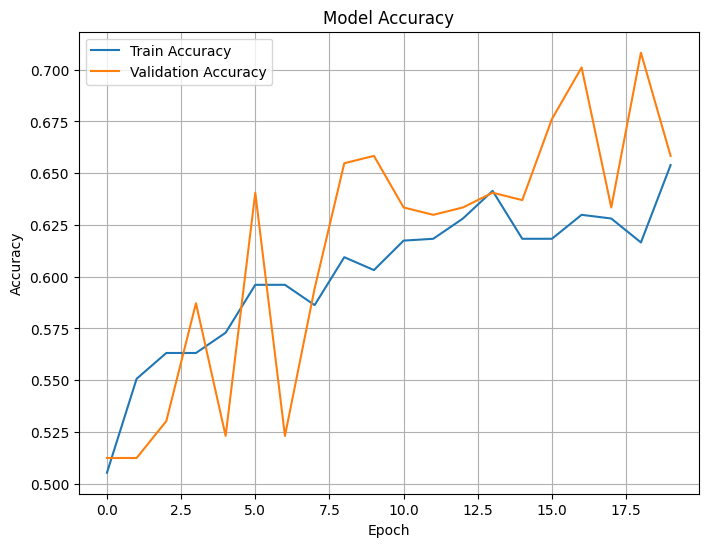

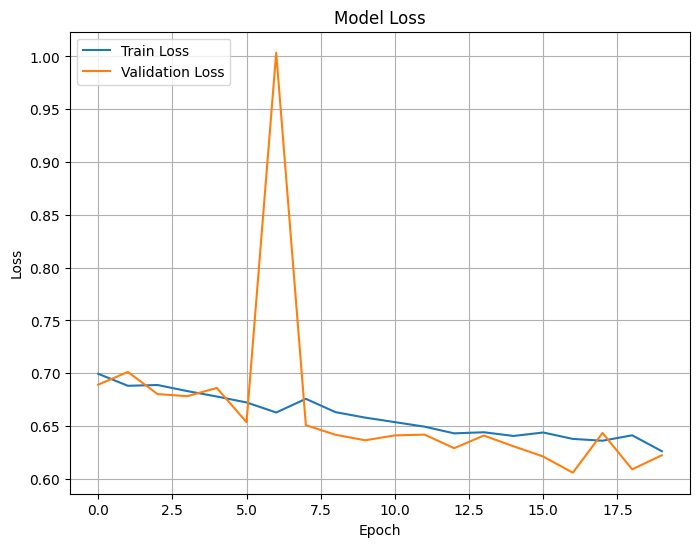

In [122]:
import matplotlib.pyplot as plt

# Courbe de l'accuracy
plt.figure(figsize=(8, 6)) 
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(loc='upper left')
plt.grid(True) 
plt.show()

# Courbe du loss
plt.figure(figsize=(8, 6)) 
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(loc='upper left')
plt.grid(True)  
plt.show()

## 4. Prédiction
Finalement, une fois nous avons passé par toutes les étapes précédentes et que le modèle est entrainé, maintenant nous allons passer à la dernière étape, celle de la prédiction. Pour cela , nous allons utiliser des images de notre lot de validation de façon aléatoire, et nous allons comparer les résultats de la prédiction avec leurs vrais valeurs. Ce test nous permettra de mettre notre modèle à l'épreuve et de valider ses percentages d'accuracy. 

Nous pouvons finalement constater que les percentages de certitude du modèle sont correctes , le modèle fonctionne mais il n'est pas encore optimal. Il existe encore la possibilité de modifier les parametres des couches du modèle pour trouver ceux qui nous permettent de rendre notre modèle encore plus performant.

1/1 [==============================] - 0s 213ms/step


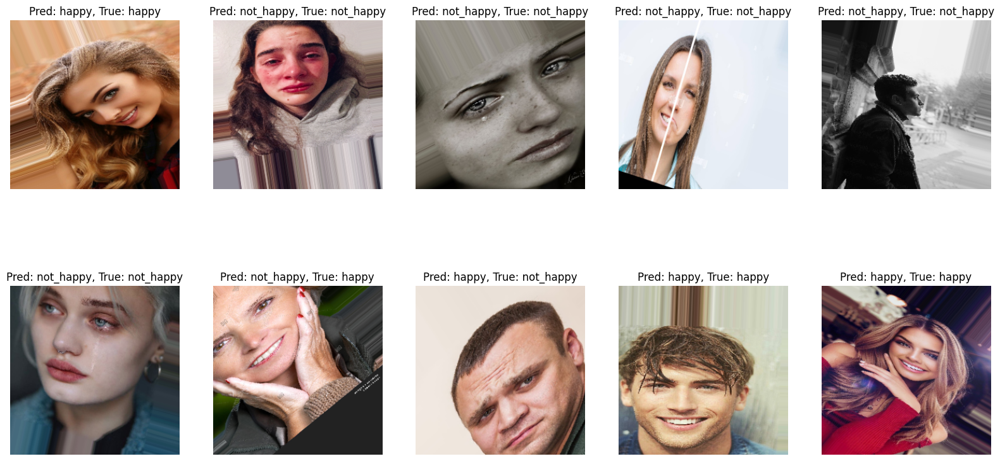

In [123]:
# Get a batch of images and labels from the validation generator
x_val, y_val = next(validation_generator)

# Use the trained model to predict the classes of the validation images
predictions = model.predict(x_val)

# Convert the predictions to binary classes (0 or 1) based on the threshold of 0.5
predicted_classes = (predictions > 0.5).astype("int32")

# Define a function to display the images along with their predicted and actual labels
def display_predictions(images, predictions, true_labels, class_labels, num_images=10):
    plt.figure(figsize=(20, 10))
    for i in range(num_images):
        plt.subplot(2, num_images // 2, i + 1)
        plt.imshow(images[i])
        plt.title(f"Pred: {class_labels[predictions[i][0]]}, True: {class_labels[true_labels[i]]}")
        plt.axis('off')
    plt.show()

# Class labels mapping
class_labels = {0: 'happy', 1: 'not_happy'}

# Display the first 10 images along with their predicted and true labels
display_predictions(x_val, predicted_classes, y_val, class_labels, num_images=10)

## 5. Conclusion
Comme conclusion nous considérons ce type de modèle très intérésant et très utile. Même si notre modèle est utilisé pour faire de la catégorisation binaire, cela nous montre la capacité des modèles de machine learning à reconnaitre des patterns et même sur le visage humain. Construir ce modèle est devenu une expérience d'apprentisage qui nous montre les défis que les professionnels du secteur risquent d'avoir. Dès l'extraction de la donnée à la manipulation et choix des paramétres du model, nous trouvons beaucoup des variables à considérér et beaucoup de complexité et tout cela apporte à la construction d'un modèle robust.

En terme des racommendations pour que notre projet évolue , nous pourrions considérer à utiliser des combinaisons des couches et des kernels différents, ainsi qu'essayer avec un autre optimiser (comme 'adam' qui est largement utilisé pour ce type de modèles). Nous pourrions aussi aller vérifier et retravailler la donnée pour avoir de la donnée de plus qualité et plus des images tant pour l'entrainement comme pour la validation.

En résumé, un projet au moins très stimulant et challengeant.

## 6. Anexe :
### 6.1 Voir les soucouches d'entrainement du modèle

Nous avons ajouté comme anexe une vue des images du model en passent par les différents sous-couches d'entrainement. Pour montrer la différence entre nos deux classes, nous avons choisi une image de chaque classe, donc 'happy' et 'sad'. Nous pouvons ensuite donc voir comment les différentes couches de notre modèle transforment les images choisis. 

Comme nous pouvons constater, sur l'image 'happy' le modèle gardera toujours une sorte de ligne courbe convèxe , celle qui represente bien entendu le sourire.

Pour l'image de la catégorie 'sad', nous pouvons voir que il y aura certaines lignes autour des yeux et une sorte de ligne courbe concave pour réprésenter la bouche.

Nous constatons donc la différence que l'implementation de notre modèle réprésente pour la machine lors de comprendre la différence et les différents patterns des images de nos deux classes.

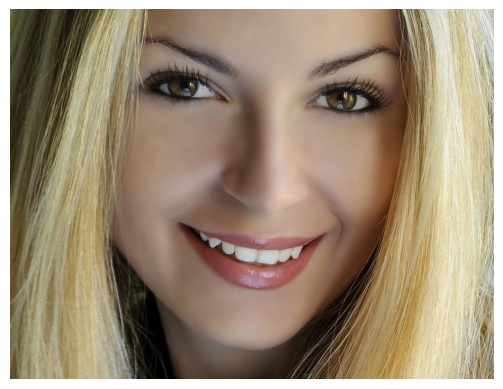

-----------------------------------------------------
conv2d_36 - Convolutional Layer
1/1 [==============================] - 0s 57ms/step
conv2d_36 | Features Shape: (1, 254, 254, 16)
Dimension 16
--------
max_pooling2d_36 - Pooling Layer
1/1 [==============================] - 0s 69ms/step
max_pooling2d_36 | Features Shape: (1, 127, 127, 16)
Dimension 16
-----------------------------------------------------
-----------------------------------------------------
conv2d_37 - Convolutional Layer
1/1 [==============================] - 0s 82ms/step
conv2d_37 | Features Shape: (1, 125, 125, 32)
Dimension 32
--------
max_pooling2d_37 - Pooling Layer
1/1 [==============================] - 0s 103ms/step
max_pooling2d_37 | Features Shape: (1, 62, 62, 32)
Dimension 32
-----------------------------------------------------
-----------------------------------------------------
conv2d_38 - Convolutional Layer
1/1 [==============================] - 0s 92ms/step
conv2d_38 | Features Shape: (1, 60, 60, 6

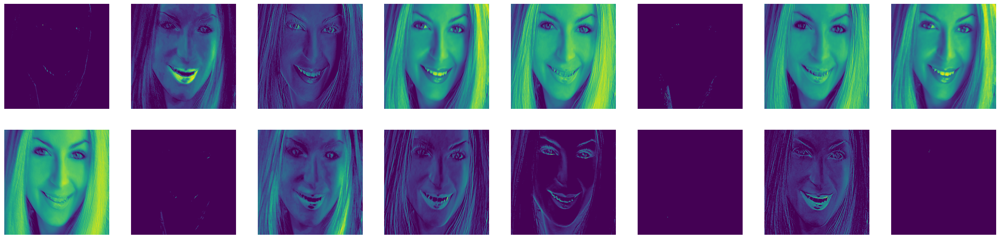

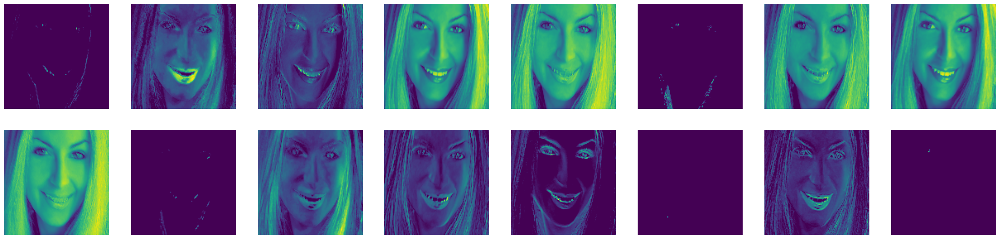

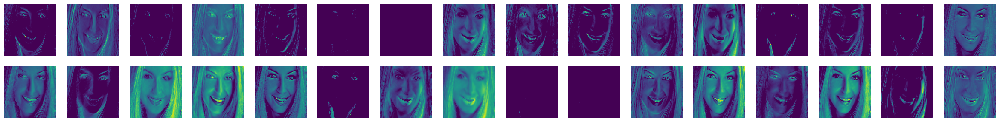

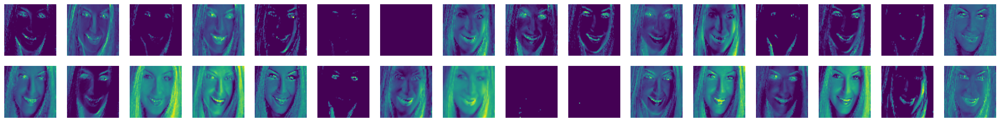

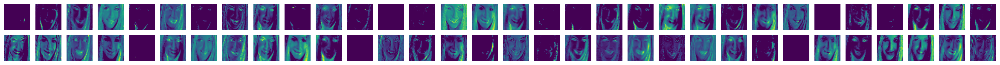

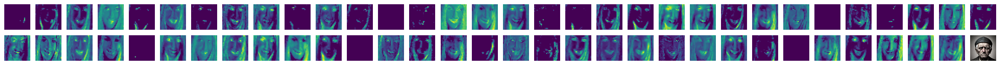

-----------------------------------------------------
conv2d_36 - Convolutional Layer
1/1 [==============================] - 0s 59ms/step
conv2d_36 | Features Shape: (1, 254, 254, 16)
Dimension 16
--------
max_pooling2d_36 - Pooling Layer
1/1 [==============================] - 0s 52ms/step
max_pooling2d_36 | Features Shape: (1, 127, 127, 16)
Dimension 16
-----------------------------------------------------
-----------------------------------------------------
conv2d_37 - Convolutional Layer
1/1 [==============================] - 0s 84ms/step
conv2d_37 | Features Shape: (1, 125, 125, 32)
Dimension 32
--------
max_pooling2d_37 - Pooling Layer
1/1 [==============================] - 0s 80ms/step
max_pooling2d_37 | Features Shape: (1, 62, 62, 32)
Dimension 32
-----------------------------------------------------
-----------------------------------------------------
conv2d_38 - Convolutional Layer
1/1 [==============================] - 0s 103ms/step
conv2d_38 | Features Shape: (1, 60, 60, 6

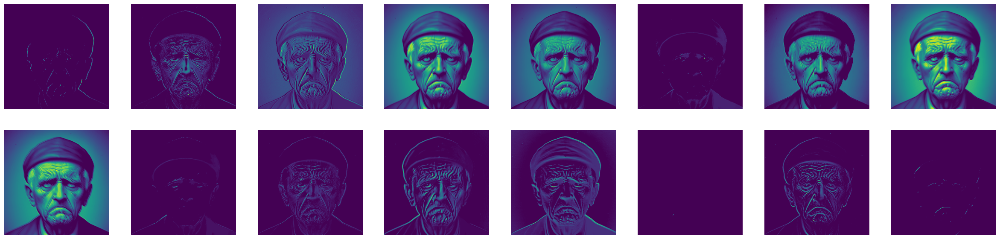

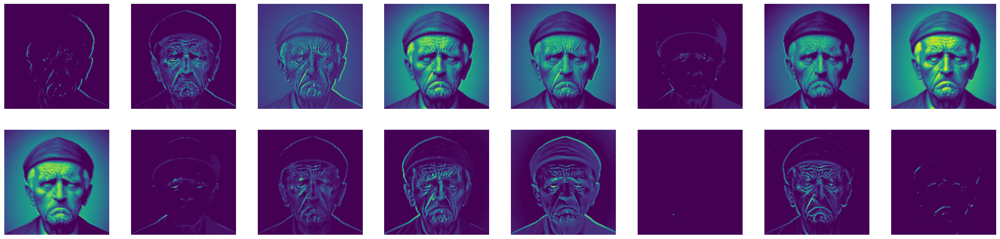

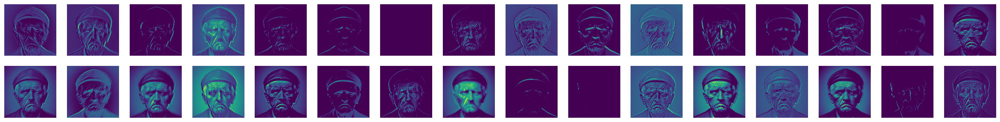

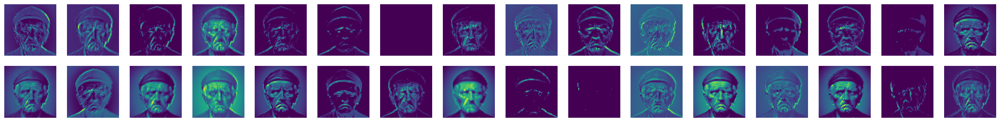

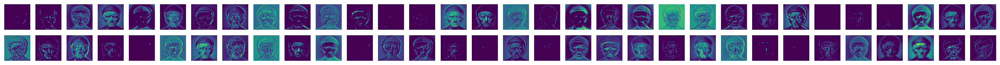

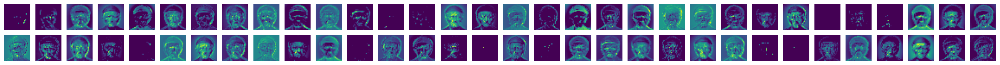

In [124]:
import numpy as np
from tensorflow.keras.models import Model
from tensorflow.keras.preprocessing.image import load_img, img_to_array

# Function to display filters for images
def display_image_filtered(name_image, model, layer_name, image):
    inp = model.inputs 
    out1 = model.get_layer(layer_name).output  
    feature_map_1 = Model(inputs=inp, outputs=out1)  
    
    # Resize image to model input size and normalize
    img = image.resize((256, 256))  # Adjust size to model input
    img_array = img_to_array(img) / 255.0  # Normalize image
    input_img = np.expand_dims(img_array, axis=0)  # Add batch dimension
    
    # Predict the feature map
    f = feature_map_1.predict(input_img) 
    dim = f.shape[3]
    print(f'{layer_name} | Features Shape: {f.shape}')
    print(f'Dimension {dim}')
    
    # Plot feature maps
    fig = plt.figure(figsize=(30, 30))
    if not os.path.exists(f'results_{name_image}'):
        os.makedirs(f'results_{name_image}')        
    for i in range(dim):
        ax = fig.add_subplot(dim // 2, dim // 2, i + 1)
        ax.axis('off')
        ax.imshow(f[0, :, :, i])
        plt.imsave(f'results_{name_image}/{name_image}_{layer_name}_{i}.jpg', f[0, :, :, i])

# Define the base directory for the dataset
base_dir = 'images'

# Load images for 'happy' and 'not_happy' using Pillow
happy_images_dir = os.path.join(base_dir, 'happy')
sad_images_dir = os.path.join(base_dir, 'sad')

# Example images from the directories
happy_image_path = os.path.join(happy_images_dir, 'attractive-woman-free-stock-photo-1.jpg') 
sad_image_path = os.path.join(sad_images_dir, '64bd1492-1297.webp') 

# Load images
image_happy = load_img(happy_image_path)
image_sad = load_img(sad_image_path)

# Ensure images are read correctly
if image_happy is None:
    print("Error loading 'happy' image.")
if image_sad is None:
    print("Error loading 'not_happy' image.")

# Mapping of layer names
conv_layers = [layer.name for layer in model.layers if 'conv2d' in layer.name]
pooling_layers = [layer.name for layer in model.layers if 'max_pooling2d' in layer.name]

for name, image in [('happy', image_happy), ('not_happy', image_sad)]:
    plt.axis('off')
    plt.imshow(image)
    plt.show()
    
    for conv_layer, pool_layer in zip(conv_layers, pooling_layers):
        print('-----------------------------------------------------')
        print(f'{conv_layer} - Convolutional Layer')
        display_image_filtered(name, model, conv_layer, image)
        print('--------')
        print(f'{pool_layer} - Pooling Layer')
        display_image_filtered(name, model, pool_layer, image)
        print('-----------------------------------------------------')
